## Transcriptome Harmonization EDA

### Imports

In [124]:
from imports import * 

In [125]:
# overall imports
import importlib
import data

# data load
from data.data_load import load_transcriptome, load_connectome
importlib.reload(data.data_load)


<module 'data.data_load' from '/scratch/asr655/neuroinformatics/GeneEx2Conn/data/data_load.py'>

### Action items description: 
The current script is a functional entry point into understanding harmonization. My current notebook is called transcriptome_harmonization_EDA.ipynb. In the harmonize folder of this directory I want to create a python file called harmonizer.py, which will have modalities for combining, preprocessing, plotting, and evaluating harmonization. I may want to structure this as a class if appropriate. 

I want harmonizer.py to be able to operate on an instance of combined_df i.e. a dataframe of the following structure that contains data from several datasets.
insert .head()

The metadata should be cleaned by the user before performing any harmonization. First, one of the modalities should be the minimal_process_gene_data function. Other preprocessing functions will be added subsequently. There should then be methods for the 2d and 3d PCAs as well as the 2d and 3d umap. 

Provide me with an outline for harmonizer.py and usage suggestions.

(then want to create a function that maps each sample to a broader network using the atlas_info folder - this needs to return a new df to work with...)
(then want to create a processor that uses pycombat)
(then want to create an evaluator for KLD, mean, variance etc. for regions that are well represented across many datasets)
(then want to create an evaluator using scib)

(tests with AHBA raw?)


### Paths

In [167]:
par_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))
data_dir = par_dir + '/data'
samples_dir = data_dir + '/samples_files'


In [168]:
csv_paths = [samples_dir + '/' + f for f in os.listdir(samples_dir) if f.endswith('.csv')]
print(csv_paths)

['/scratch/asr655/neuroinformatics/data/samples_files/UTSW_samples.csv', '/scratch/asr655/neuroinformatics/data/samples_files/HBT_samples.csv', '/scratch/asr655/neuroinformatics/data/samples_files/AHBA_raw_samples.csv', '/scratch/asr655/neuroinformatics/data/samples_files/GTEx_samples.csv', '/scratch/asr655/neuroinformatics/data/samples_files/HBT_Brainspan_samples.csv', '/scratch/asr655/neuroinformatics/data/samples_files/CBB_samples.csv', '/scratch/asr655/neuroinformatics/data/samples_files/AHBA_srs_samples.csv']


In [169]:
# manually remove any csv_paths if necessary
csv_paths= ['/scratch/asr655/neuroinformatics/data/samples_files/UTSW_samples.csv', '/scratch/asr655/neuroinformatics/data/samples_files/HBT_samples.csv', '/scratch/asr655/neuroinformatics/data/samples_files/AHBA_raw_samples.csv', '/scratch/asr655/neuroinformatics/data/samples_files/GTEx_samples.csv', '/scratch/asr655/neuroinformatics/data/samples_files/HBT_Brainspan_samples.csv', '/scratch/asr655/neuroinformatics/data/samples_files/CBB_samples.csv']


In [170]:
for txt_file in os.listdir(data_dir + '/genelist_files'): 
    print(txt_file)

gene_list 6.txt
gene_list.txt
gene_list 4.txt
gene_list 5.txt
gene_list 2.txt
gene_list 3.txt


#### Evaluate gene overlap across datasets


In [171]:
def find_gene_intersection(data_dir):
    # Initialize a set to store the intersection of genes
    gene_intersection = None

    # Iterate over each txt file in the directory
    for txt_file in os.listdir(data_dir):
        # Check if the file is a txt file
        if txt_file.endswith('.txt'):
            # Read the gene list from the file
            with open(os.path.join(data_dir, txt_file), 'r') as file:
                gene_set = set(file.read().splitlines())

                # If it's the first file, start the intersection with this set
                if gene_intersection is None:
                    gene_intersection = gene_set
                else:
                    # Intersect with the current set of genes
                    gene_intersection &= gene_set

    # If there are no intersecting genes, handle it appropriately
    if gene_intersection is None:
        return set(), 0

    # Return the intersecting genes and their count
    return gene_intersection, len(gene_intersection)

# Example usage
intersecting_genes, gene_count = find_gene_intersection(data_dir + '/genelist_files')
print(gene_count, 'overlapping genes')

10605 overlapping genes


### Clean metadata

In [177]:
def clean_csv_metadata(csv_path): 
    """
    Function to categorize sex, age, ethnicity if possible,
    retain only overlapping genes, and create an age decade column.
    """
    dataset_df = pd.read_csv(csv_path)

    # Keep only the first 2 characters in the age column (assumed to be the numeric part)
    dataset_df['age'] = dataset_df['age'].astype(str).str[:2].astype(int)  # Convert to int after slicing

    # Create the age decade column
    def assign_age_decade(age):
        if age >= 10:
            return f'{age // 10 * 10}-{age // 10 * 10 + 9}'
        else:
            return '0-9'  # Handle very young ages, if any
    
    dataset_df['age decade'] = dataset_df['age'].apply(assign_age_decade)
    
     # Move the 'age_decade' column right after 'age'
    age_idx = dataset_df.columns.get_loc('age')
    cols = dataset_df.columns.tolist()
    cols.insert(age_idx + 1, cols.pop(cols.index('age decade')))
    dataset_df = dataset_df[cols]  # Reorder the columns
    # Map sex: make M=1, F=2
    dataset_df['sex'] = dataset_df['sex'].replace({1: 'M', 2: 'F'})

    # Placeholder for ethnicity processing (you can add more entries to ethnicity_dict later)
    ethnicities = ['Caucasian', 'Hispanic', 'African', 'African American', 'Asian', 'Caribbean', 'Middle Eastern']
    ethnicity_dict = {'Caucasian': ['Caucasian', 'European']}

    # Dynamically find where metadata ends and gene columns start
    metadata_end_column = 'sequencing_type'
    metadata_columns = dataset_df.columns[:dataset_df.columns.get_loc(metadata_end_column) + 1].tolist()

    # Find the intersecting genes that are present in the DataFrame and sort them alphabetically
    gene_columns = [col for col in dataset_df.columns if col not in metadata_columns and col in intersecting_genes]
    sorted_gene_columns = sorted(gene_columns)

    # Combine metadata columns with the sorted gene columns
    cols_to_keep = metadata_columns + sorted_gene_columns

    # Filter the DataFrame to keep only the necessary columns
    dataset_df = dataset_df[cols_to_keep]
    
    print(dataset_df.head())  # For debugging purposes, can be removed later
    sample_dfs.append(dataset_df)

sample_dfs = []

for csv in csv_paths:
    clean_csv_metadata(csv)

     ID  age age decade sex  ethnicity tissue sample local name  \
0  1029   30      30-39   M        NaN                     BA21   
1  1029   30      30-39   M        NaN                     BA22   
2  1029   30      30-39   M        NaN                     BA39   
3  1029   30      30-39   M        NaN                     BA40   
4  1029   30      30-39   M        NaN                     BA44   

                  tissue sample(s) in atlas name     atlas  \
0                    BA21: Middle temporal gyrus  Brodmann   
1                  BA22: Superior temporal gyrus  Brodmann   
2                            BA39: Angular gyrus  Brodmann   
3                      BA40: Supramarginal gyrus  Brodmann   
4  BA44: Pars opercularis (part of Broca's area)  Brodmann   

        centroid coordinates              dataset  ...      ZW10    ZWILCH  \
0   [(-61.68, -29.0, -9.41)]  UTSW Medical Center  ...   88292.0  149522.0   
1   [(-56.02, -21.08, 0.53)]  UTSW Medical Center  ...   84111.0  11

In [179]:
# combine datasets into one main dataframe
combined_df = pd.concat(sample_dfs, axis=0, ignore_index=True)
threshold = int(combined_df.shape[1] * 0.5)  # drop null rows
combined_df = combined_df.dropna(thresh=threshold)
print(combined_df.shape)

(3754, 10616)


In [180]:
combined_df.head()

,ID,age,age decade,sex,ethnicity,tissue sample local name,tissue sample(s) in atlas name,atlas,centroid coordinates,dataset,...,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3
0,1029,30,30-39,M,NaN,BA21,BA21: Middle temporal gyrus,Brodmann,"[(-61.68, -29.0, -9.41)]",UTSW Medical Center,...,88292.0,149522.0,47315.0,30786.0,80127.0,136638.0,440872.0,839983.0,190575.0,198668.0
1,1029,30,30-39,M,NaN,BA22,BA22: Superior temporal gyrus,Brodmann,"[(-56.02, -21.08, 0.53)]",UTSW Medical Center,...,84111.0,110218.0,50012.0,29532.0,92682.0,109457.0,509951.0,789183.0,168221.0,148489.0
2,1029,30,30-39,M,NaN,BA39,BA39: Angular gyrus,Brodmann,"[(-47.88, -61.58, 30.79)]",UTSW Medical Center,...,97966.0,124002.0,62001.0,28133.0,82380.0,87682.0,443938.0,696614.0,132902.0,190575.0
3,1029,30,30-39,M,NaN,BA40,BA40: Supramarginal gyrus,Brodmann,"[(-53.23, -34.82, 34.29)]",UTSW Medical Center,...,105728.0,158048.0,61147.0,29532.0,97290.0,86475.0,539028.0,632191.0,113317.0,229797.0
4,1029,30,30-39,M,NaN,BA44,BA44: Pars opercularis (part of Broca's area),Brodmann,"[(-50.54, 10.45, 17.24)]",UTSW Medical Center,...,85285.0,65083.0,42642.0,26432.0,68319.0,131984.0,419991.0,509951.0,152664.0,231395.0


In [181]:
# Add macro-region column

# List of regions to be labeled as 'Subcortical Microstructure'
subcortical_microstructure_regions = [
    'LH-GPe', 'LH-GPi', 'LH-VeP', 'LH-HTH', 'LH-SNc_PBP_VTA', 'LH-RN', 'LH-SNr',
    'RH-GPe', 'RH-GPi', 'RH-RN', 'RH-SNr', 'RH-HTH', 'RH-MN', 'RH-SNc_PBP_VTA',
    'Hypothalamus', 'Substantia nigra', 'Globus Pallidus', 'Internal Capsule', 'Substantia Nigra'
]

# Function to map MNI region from coordinates
def get_mni_region_from_coords(coords, mni_data, affine, mni_label_map):
    """
    Given a list of coordinates, determine the most frequent MNI macro region.
    If no match is found, use the closest XML centroid.
    
    Args:
        coords (list of tuples): List of 3D MNI coordinates.
        mni_data (numpy array): The loaded MNI atlas data.
        affine (numpy array): Affine transformation matrix from the NIfTI file.
        mni_label_map (dict): Dictionary mapping MNI ROI values to labels.

    Returns:
        str: Most frequent MNI region label.
    """
    regions = []
    
    for coord in coords:
        if coord is None:
            continue  # Skip if the coordinate is None

        # Transform MNI coordinates to voxel indices using the affine
        voxel_coord = nib.affines.apply_affine(np.linalg.inv(affine), coord)
        voxel_coord = np.round(voxel_coord).astype(int)

        # Ensure the voxel coordinates are within the MNI data bounds
        if (0 <= voxel_coord[0] < mni_data.shape[0] and
            0 <= voxel_coord[1] < mni_data.shape[1] and
            0 <= voxel_coord[2] < mni_data.shape[2]):
            region_value = mni_data[tuple(voxel_coord)]
            region_label = mni_label_map.get(int(region_value), None)
            
            # If a region label is found in the MNI data, add it
            if region_label:
                regions.append(region_label)
            else:
                continue  # Skip unknown values in MNI data
        else:
            continue  # Skip out-of-bounds coordinates

    if regions:
        most_common_region = Counter(regions).most_common(1)[0][0]
        return most_common_region
    else:
        return 'Unknown'

# Function to assign macro regions based on centroid coordinates
def assign_macro_regions(combined_df, mni_data, affine, mni_label_map):
    """
    Assign a macro brain region to each sample based on centroid coordinates.
    
    Args:
        combined_df (pd.DataFrame): DataFrame containing the centroid coordinates.
        mni_data (numpy array): The loaded MNI atlas data.
        affine (numpy array): Affine transformation matrix from the NIfTI file.
        mni_label_map (dict): Dictionary mapping MNI ROI values to labels.
        
    Returns:
        pd.DataFrame: Updated DataFrame with the macro region column added.
    """
    # Create a new column to store the macro regions
    macro_regions = []

    for idx, row in combined_df.iterrows():
        centroid_coords = row['centroid coordinates']
        tissue_local_name = row['tissue sample local name']

        if centroid_coords is not None:
            if isinstance(centroid_coords, str):
                centroid_coords = eval(centroid_coords)
            
            if isinstance(centroid_coords, list):
                valid_coords = [coord for coord in centroid_coords if coord is not None]
                
                if valid_coords:
                    macro_region = get_mni_region_from_coords(valid_coords, mni_data, affine, mni_label_map)
                    if macro_region == 'Unknown' and tissue_local_name in subcortical_microstructure_regions:
                        macro_region = 'Subcortical Microstructure'
                else:
                    macro_region = 'Unknown'
            else:
                macro_region = 'Unknown'
        else:
            # Check if the local tissue name falls under the subcortical microstructure regions
            if tissue_local_name in subcortical_microstructure_regions:
                macro_region = 'Subcortical Microstructure'
            else:
                macro_region = 'Unknown'
        
        macro_regions.append(macro_region)

    # Insert the macro region column into the DataFrame after the centroid coordinates column
    combined_df.insert(combined_df.columns.get_loc('centroid coordinates') + 1, 'macro region', macro_regions)
    
    return combined_df

In [182]:
import nibabel as nib

# Sample usage
mni_nifti_path = data_dir+'/atlas_info/MNI-maxprob-thr0-1mm.nii'
mni_xml_path = '/path_to_mni_atlas/MNI.xml'

# Load the MNI atlas and the label mapping (you'll need to parse the MNI.xml to get this mapping)
mni_data, affine = load_mni_atlas(mni_nifti_path)

# Add the MNI region mapping based on the MNI.xml file.
mni_label_map = {
    1:'Caudate',
    2:'Cerebellum',
    3:'Frontal Lobe',
    4:'Insula',
    5:'Occipital Lobe',
    6:'Parietal Lobe',
    7:'Putamen',
    8:'Temporal Lobe',
    9:'Thalamus'
}

# Assign macro regions to the combined_df
combined_df = assign_macro_regions(combined_df, mni_data, affine, mni_label_map)

# Show the updated DataFrame with the macro region column
print(combined_df.head())

     ID  age age decade sex ethnicity tissue sample local name  \
0  1029   30      30-39   M       NaN                     BA21   
1  1029   30      30-39   M       NaN                     BA22   
2  1029   30      30-39   M       NaN                     BA39   
3  1029   30      30-39   M       NaN                     BA40   
4  1029   30      30-39   M       NaN                     BA44   

                  tissue sample(s) in atlas name     atlas  \
0                    BA21: Middle temporal gyrus  Brodmann   
1                  BA22: Superior temporal gyrus  Brodmann   
2                            BA39: Angular gyrus  Brodmann   
3                      BA40: Supramarginal gyrus  Brodmann   
4  BA44: Pars opercularis (part of Broca's area)  Brodmann   

        centroid coordinates   macro region  ...      ZW10    ZWILCH    ZWINT  \
0   [(-61.68, -29.0, -9.41)]  Temporal Lobe  ...   88292.0  149522.0  47315.0   
1   [(-56.02, -21.08, 0.53)]  Temporal Lobe  ...   84111.0  110218.0

In [183]:
combined_df.head(5)

,ID,age,age decade,sex,ethnicity,tissue sample local name,tissue sample(s) in atlas name,atlas,centroid coordinates,macro region,...,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3
0,1029,30,30-39,M,NaN,BA21,BA21: Middle temporal gyrus,Brodmann,"[(-61.68, -29.0, -9.41)]",Temporal Lobe,...,88292.0,149522.0,47315.0,30786.0,80127.0,136638.0,440872.0,839983.0,190575.0,198668.0
1,1029,30,30-39,M,NaN,BA22,BA22: Superior temporal gyrus,Brodmann,"[(-56.02, -21.08, 0.53)]",Temporal Lobe,...,84111.0,110218.0,50012.0,29532.0,92682.0,109457.0,509951.0,789183.0,168221.0,148489.0
2,1029,30,30-39,M,NaN,BA39,BA39: Angular gyrus,Brodmann,"[(-47.88, -61.58, 30.79)]",Parietal Lobe,...,97966.0,124002.0,62001.0,28133.0,82380.0,87682.0,443938.0,696614.0,132902.0,190575.0
3,1029,30,30-39,M,NaN,BA40,BA40: Supramarginal gyrus,Brodmann,"[(-53.23, -34.82, 34.29)]",Parietal Lobe,...,105728.0,158048.0,61147.0,29532.0,97290.0,86475.0,539028.0,632191.0,113317.0,229797.0
4,1029,30,30-39,M,NaN,BA44,BA44: Pars opercularis (part of Broca's area),Brodmann,"[(-50.54, 10.45, 17.24)]",Frontal Lobe,...,85285.0,65083.0,42642.0,26432.0,68319.0,131984.0,419991.0,509951.0,152664.0,231395.0


In [184]:
# Count the number of 'Unknown' entries in the 'macro region' column
unknown_count = combined_df[combined_df['macro region'] == 'Unknown'].shape[0]
print(f"Number of 'Unknown' entries in 'macro region': {unknown_count}")

# Retrieve the 'tissue sample local name' values corresponding to the 'Unknown' entries
unknown_tissues = combined_df.loc[combined_df['macro region'] == 'Unknown', 'tissue sample local name']
print("Tissue sample local names corresponding to 'Unknown' macro regions:")
print(unknown_tissues.tolist())


Number of 'Unknown' entries in 'macro region': 4
Tissue sample local names corresponding to 'Unknown' macro regions:
['Internal Capsule', 'Internal Capsule', 'Internal Capsule', 'Internal Capsule']


### Raw gene data

Gene array shape: (3754, 10605)


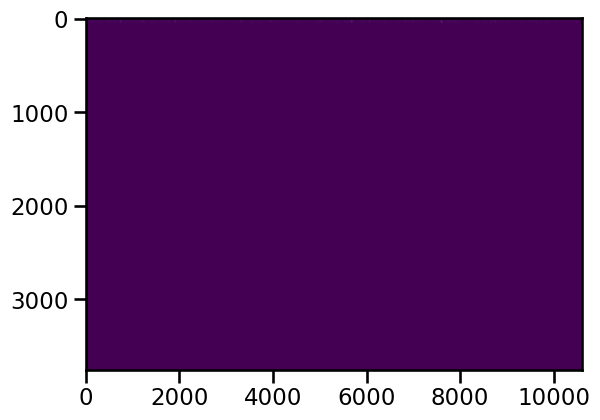

In [51]:
# Assuming the first 10 columns are metadata, and the rest are gene columns
gene_df = combined_df.iloc[:, 10:]  # Select all columns from the 11th onward

# Convert the gene DataFrame to a NumPy array
raw_gene_array = gene_df.to_numpy()

print(f"Gene array shape: {raw_gene_array.shape}")

plt.imshow(raw_gene_array, aspect=2)

In [52]:

# Assuming raw_gene_array is already defined and all values are of type float

# Calculate the minimum value
min_value = np.min(raw_gene_array)

# Calculate the maximum value
max_value = np.max(raw_gene_array)

# Calculate the median value
median_value = np.median(raw_gene_array)

# Calculate the mean value
mean_value = np.mean(raw_gene_array)

# Print the results
print(f"Minimum value: {min_value}")
print(f"Maximum value: {max_value}")
print(f"Median value: {median_value}")
print(f"Mean value: {mean_value}")


Minimum value: 0.0
Maximum value: 51568974.0
Median value: 4.3437291098940465
Mean value: 8115.740592514519


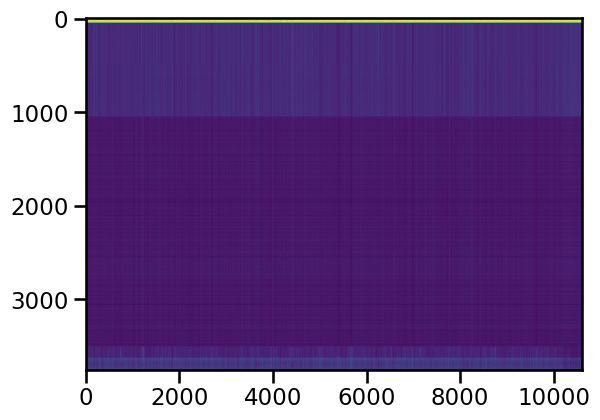

In [53]:
scaler = MinMaxScaler()
plt.imshow(scaler.fit_transform(np.log1p(raw_gene_array)), aspect=2)

### Basic preprocessing

Preprocessing levels per dataset: 
- AHBA (MH): Scaled-robust sigmoid --> min-max
- CBB (RNA-seq): TPM --> log-transform --> min-max
- UTSW (RNA-seq): RPKM (high values) --> log-transform --> min-max
- GTEx (RNA-seq): TPMs (log-transformed and 1st and 99th percentile clipped) --> min-max
- Yale HBT (MH): Raw --> min-max
- HBT Brainspan (RNA-seq): RPKM --> log-transform --> min-max

In [58]:
combined_df['dataset'].unique()

array(['UTSW Medical Center', 'Yale HBT', 'AHBA', 'GTEx', 'HBT Brainspan',
       'Chinese Brain Bank'], dtype=object)

In [62]:

def minimal_process_gene_data(combined_df):

    # Create a copy of the combined_df to avoid modifying the original DataFrame
    processed_df = combined_df.copy()
    
    # Define the preprocessing steps for each dataset
    preprocessing_steps = {
        'AHBA': ['min_max'], # ['scaled_robust_sigmoid'],
        'Chinese Brain Bank': ['log_transform', 'min_max'],
        'UTSW Medical Center': ['log_transform', 'min_max'],
        'GTEx': ['min_max'],
        'Yale HBT': ['min_max'],
        'HBT Brainspan': ['log_transform', 'min_max'] # something happening with these datasets that's causing weird norm
    }

    # Loop over each unique dataset
    for dataset in processed_df['dataset'].unique():
        # Initialize MinMaxScaler
        scaler = MinMaxScaler()
        
        # Subset the DataFrame by the current dataset
        dataset_df = processed_df[processed_df['dataset'] == dataset]

        # Get the gene columns (assuming they are from the 10th column onwards)
        gene_columns = dataset_df.columns[10:]

        # Perform the preprocessing steps
        steps = preprocessing_steps.get(dataset, [])
        if 'scaled_robust_sigmoid' in steps:
            # Apply the scaled robust sigmoid if needed (placeholder for actual implementation)
            pass
        
        if 'log_transform' in steps:
            # Apply Log + 1 Transform using .loc to avoid SettingWithCopyWarning
            processed_df.loc[dataset_df.index, gene_columns] = np.log1p(processed_df.loc[dataset_df.index, gene_columns])
        
        if 'min_max' in steps:
            # Apply Min-Max Scaling using .loc to avoid SettingWithCopyWarning
            scaled_values = scaler.fit_transform(processed_df.loc[dataset_df.index, gene_columns])
            processed_df.loc[dataset_df.index, gene_columns] = scaled_values

    return processed_df

minimal_processed_df = minimal_process_gene_data(combined_df)
print(minimal_processed_df.head())

     ID age sex ethnicity tissue sample local name  \
0  1029  30   M       NaN                     BA21   
1  1029  30   M       NaN                     BA22   
2  1029  30   M       NaN                     BA39   
3  1029  30   M       NaN                     BA40   
4  1029  30   M       NaN                     BA44   

                  tissue sample(s) in atlas name     atlas  \
0                    BA21: Middle temporal gyrus  Brodmann   
1                  BA22: Superior temporal gyrus  Brodmann   
2                            BA39: Angular gyrus  Brodmann   
3                      BA40: Supramarginal gyrus  Brodmann   
4  BA44: Pars opercularis (part of Broca's area)  Brodmann   

        centroid coordinates              dataset sequencing_type  ...  \
0   [(-61.68, -29.0, -9.41)]  UTSW Medical Center         RNA-Seq  ...   
1   [(-56.02, -21.08, 0.53)]  UTSW Medical Center         RNA-Seq  ...   
2  [(-47.88, -61.58, 30.79)]  UTSW Medical Center         RNA-Seq  ...   
3  [(-

Gene array shape: (3754, 10605)
[[0.50698252 0.80088477 0.60651388 ... 0.90909121 0.82683849 0.6853142 ]
 [0.33332055 0.86283197 0.6249587  ... 0.85454551 0.74891518 0.3916038 ]
 [0.63024088 0.65486696 0.48765368 ... 0.74545417 0.60172991 0.64335544]
 [0.39213098 0.7964598  0.12289224 ... 0.66060619 0.50216273 0.83216868]
 [0.68906096 0.64159285 0.59012538 ... 0.47272605 0.68830946 0.83916015]]


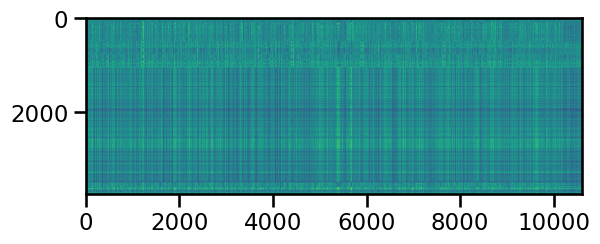

In [63]:
# Assuming the first 10 columns are metadata, and the rest are gene columns
gene_df = minimal_processed_df.iloc[:, 10:]  # Select all columns from the 11th onward

# Convert the gene DataFrame to a NumPy array
gene_array = gene_df.to_numpy()

# Print the shape of the resulting NumPy array to verify
print(f"Gene array shape: {gene_array.shape}")

# Optionally, print a small part of the array to check
print(gene_array[:5])

plt.imshow(gene_array)

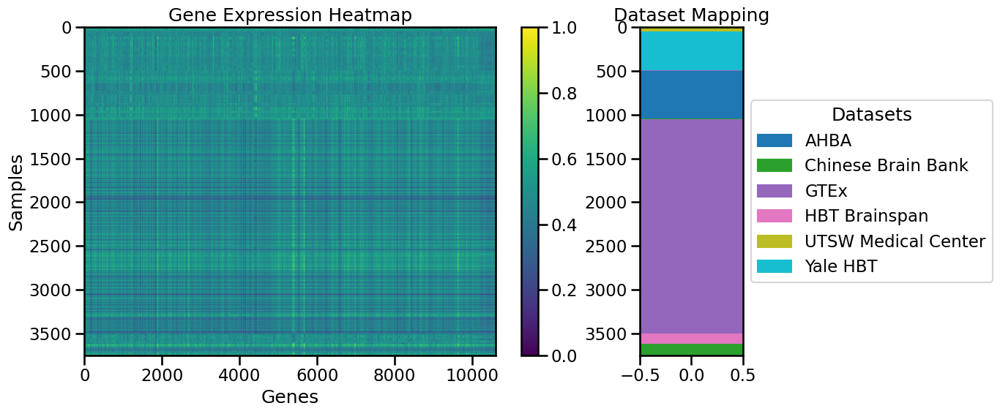

In [64]:
# Extract the dataset labels

# Extract the dataset labels
dataset_labels = minimal_processed_df['dataset'].values

# Convert dataset labels to unique integer identifiers for the legend
unique_datasets = np.unique(dataset_labels)
dataset_mapping = {label: idx for idx, label in enumerate(unique_datasets)}
mapped_labels = np.array([dataset_mapping[label] for label in dataset_labels])

# Create a colormap for the datasets
cmap = plt.get_cmap('tab10', len(unique_datasets))

# Create the figure with adjusted widths
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6), gridspec_kw={'width_ratios': [5, 1]})

# Plot the gene expression heatmap
ax1.imshow(gene_array, aspect='auto', cmap='viridis')
ax1.set_title('Gene Expression Heatmap')
ax1.set_xlabel('Genes')
ax1.set_ylabel('Samples')

# Add colorbar to the heatmap
plt.colorbar(ax1.imshow(gene_array, aspect='auto', cmap='viridis'), ax=ax1)

# Plot the dataset mapping with a colormap
ax2.imshow(mapped_labels[:, np.newaxis], aspect='auto', cmap=cmap)
ax2.set_title('Dataset Mapping')

# Create a custom legend with dataset names
legend_handles = [Patch(color=cmap(i), label=unique_datasets[i]) for i in range(len(unique_datasets))]
ax2.legend(handles=legend_handles, loc='center left', bbox_to_anchor=(1, 0.5), title="Datasets")

# Adjust layout
plt.tight_layout()
plt.show()

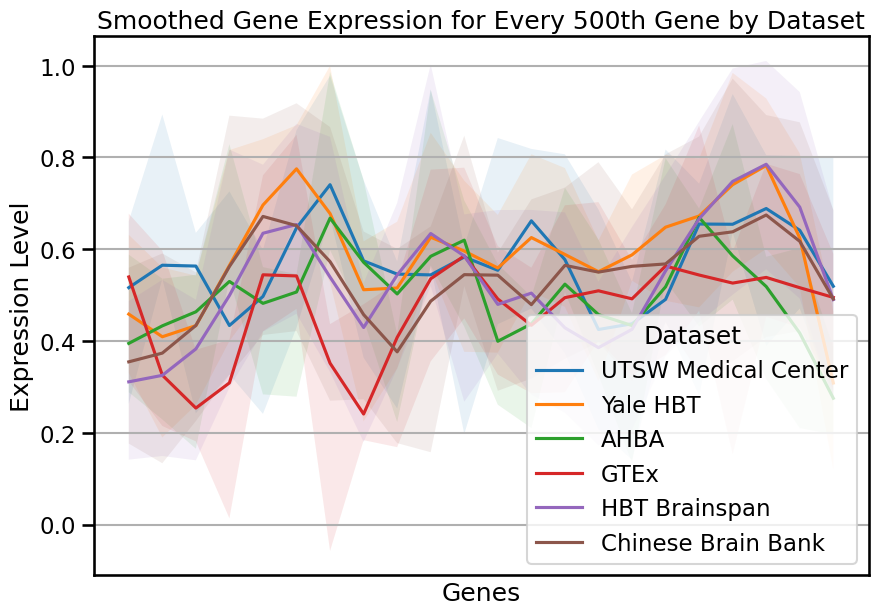

In [73]:


def lineplot_gene_expression_overview(minimal_processed_df):
    # Initialize a figure and axis
    plt.figure(figsize=(10, 7))

    # Loop over each unique dataset
    for dataset in minimal_processed_df['dataset'].unique():
        # Subset the DataFrame by the current dataset
        dataset_df = minimal_processed_df[minimal_processed_df['dataset'] == dataset]

        # Get the gene columns (assuming they are from the 10th column onwards)
        gene_columns = dataset_df.columns[10:]

        # [0:1000:len(gene_columns)]
        skip_num=500
        # Calculate the median and standard deviation for each gene
        median_values = dataset_df[gene_columns].median()[0:len(gene_columns):skip_num]
        std_values = dataset_df[gene_columns].std()[0:len(gene_columns):skip_num]

        # Apply Savitzky-Golay filter to smooth the median values
        smoothed_median_values = savgol_filter(median_values, window_length=5, polyorder=2)

        # Plot the line for the median values
        plt.plot(median_values.index, smoothed_median_values, label=dataset)

        # Add the shaded area representing standard deviation with lighter transparency
        plt.fill_between(median_values.index, 
                         median_values - std_values, 
                         median_values + std_values, 
                         alpha=0.1)  # Set transparency lighter with alpha=0.15
 
    
    # Customize the plot
    plt.title(f'Smoothed Gene Expression for Every {skip_num}th Gene by Dataset')
    plt.xlabel('Genes')
    plt.ylabel('Expression Level')
    plt.legend(title='Dataset')
    plt.grid(True)
    
    # Remove x-axis labels
    plt.xticks([])

    # Show the plot
    plt.show()

# Example usage
lineplot_gene_expression_overview(minimal_processed_df)


### Quick plot to show sampling density across the entire brain

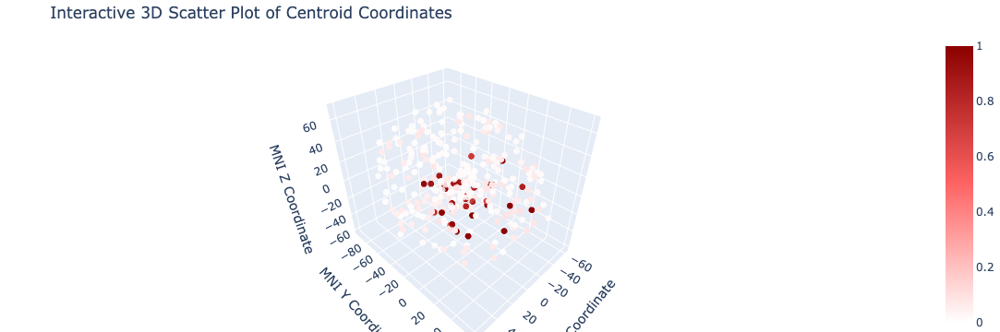

In [74]:
# Function to convert the string to a list of tuples
def parse_centroid_coordinates(coord_string):
    try:
        # Safely evaluate the string to a Python list
        return ast.literal_eval(coord_string)
    except (SyntaxError, ValueError):
        return None

# Extract all the centroid coordinates, converting strings to lists of tuples
all_coords = []

for coord_string in combined_df['centroid coordinates']:
    if coord_string and isinstance(coord_string, str):
        coords_list = parse_centroid_coordinates(coord_string)
        if coords_list is not None:
            # Filter out any None values within the coords_list
            valid_coords = [coord for coord in coords_list if coord is not None]
            all_coords.extend(valid_coords)

# Convert the list of tuples into a NumPy array for easier processing
coords_array = np.array(all_coords)

# Create a Counter object to count occurrences of each coordinate
coords_counter = Counter(map(tuple, coords_array))

# Convert the counts back into a list of colors based on frequency
colors = np.array([coords_counter[tuple(coord)] for coord in coords_array])

# Normalize colors to be between 0 and 1 for the colormap
colors_normalized = (colors - colors.min()) / (colors.max() - colors.min())

# Invert colors so that higher density is darker
colors_inverted =  colors_normalized

# Define a custom red gradient colormap
red_gradient = [
    [0.0, 'rgba(255, 255, 255, 1)'],  # Lightest red (almost white) for lowest density
    [0.5, 'rgba(255, 100, 100, 1)'],  # Medium red for intermediate density
    [1.0, 'rgba(139, 0, 0, 1)']       # Darkest red for highest density
]

# Create a 3D scatter plot using Plotly
trace = go.Scatter3d(
    x=coords_array[:, 0],
    y=coords_array[:, 1],
    z=coords_array[:, 2],
    mode='markers',
    marker=dict(
        size=4,  # Make the nodes slightly smaller
        color=colors_inverted,  # Use the inverted colors for density
        colorscale=red_gradient,  # Apply the custom red gradient colormap
        opacity=0.8,
        showscale=True
    ),
    text=[f"Density: {coords_counter[tuple(coord)]}" for coord in coords_array]
)

layout = go.Layout(
    scene=dict(
        xaxis_title='MNI X Coordinate',
        yaxis_title='MNI Y Coordinate',
        zaxis_title='MNI Z Coordinate',
    ),
    title='Interactive 3D Scatter Plot of Centroid Coordinates',
    margin=dict(l=0, r=0, b=0, t=40)
)

fig = go.Figure(data=[trace], layout=layout)

# Show the plot
fig.show()


### PCA

Raw data PCA (added some naive processing)

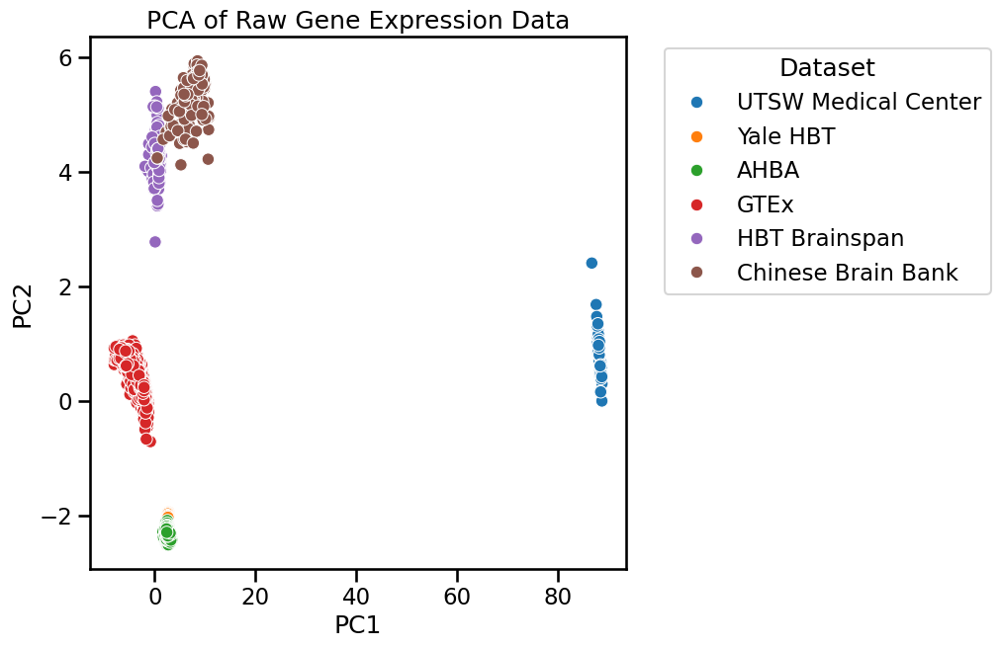

In [75]:
# Step 1: Extract gene expression data (assuming gene columns start from the 11th column onward)
gene_columns = combined_df.columns[10:]

# Step 2: Extract the gene data as a NumPy array
raw_gene_array = combined_df[gene_columns].to_numpy()

# Step 3: Perform PCA on raw data
pca_raw = PCA(n_components=2)
pca_raw_results = pca_raw.fit_transform(scaler.fit_transform(np.log1p(raw_gene_array)))

# Step 4: Plot PCA for raw data
plt.figure(figsize=(7, 7))
dataset_labels = combined_df['dataset'].values
sns.scatterplot(x=pca_raw_results[:, 0], y=pca_raw_results[:, 1], hue=dataset_labels, palette='tab10')
plt.title('PCA of Raw Gene Expression Data')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend(title='Dataset', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

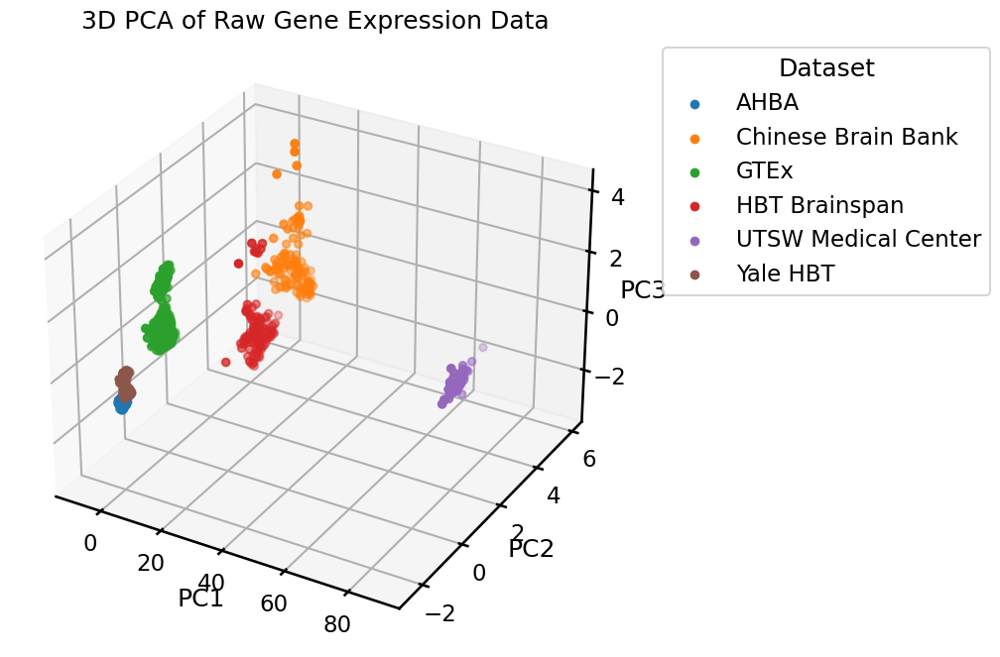

In [76]:


# Step 1: Extract gene expression data (assuming gene columns start from the 11th column onward)
gene_columns = combined_df.columns[10:]

# Step 2: Extract the gene data as a NumPy array
raw_gene_array = combined_df[gene_columns].to_numpy()

# Step 3: Perform PCA on raw data
pca_raw = PCA(n_components=3)
pca_raw_results = pca_raw.fit_transform(scaler.fit_transform(np.log1p(raw_gene_array)))

# Step 4: Plot 3D PCA for raw data
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

dataset_labels = combined_df['dataset'].values
unique_datasets = np.unique(dataset_labels)
colors = sns.color_palette("tab10", len(unique_datasets))

# Plot each dataset with a different color
for i, dataset in enumerate(unique_datasets):
    indices = np.where(dataset_labels == dataset)
    ax.scatter(pca_raw_results[indices, 0], pca_raw_results[indices, 1], pca_raw_results[indices, 2], 
               color=colors[i], label=dataset, s=30)

ax.set_title('3D PCA of Raw Gene Expression Data')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.legend(title='Dataset', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


Minimally processed data PCA

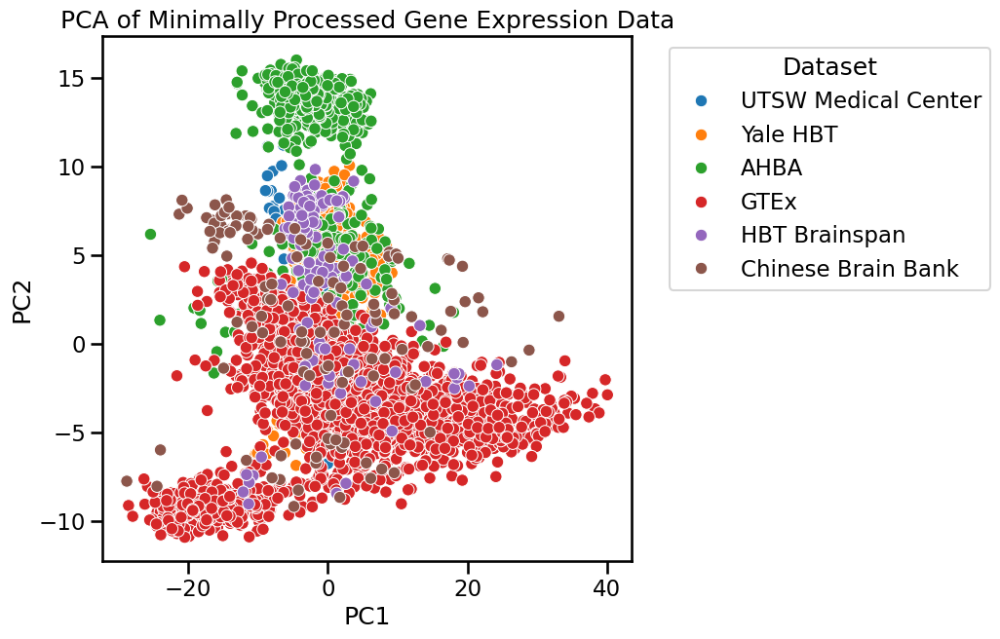

In [77]:
# Step 1: Extract gene expression data (assuming gene columns start from the 11th column onward)
gene_columns = minimal_processed_df.columns[10:]

# Step 2: Extract the gene data as a NumPy array
processed_gene_array = minimal_processed_df[gene_columns].to_numpy()

# Step 3: Perform PCA on minimally processed data
pca_processed = PCA(n_components=2)
pca_processed_results = pca_processed.fit_transform(processed_gene_array)

# Step 4: Plot PCA for minimally processed data
plt.figure(figsize=(7, 7))
dataset_labels = minimal_processed_df['dataset'].values
sns.scatterplot(x=pca_processed_results[:, 0], y=pca_processed_results[:, 1], hue=dataset_labels, palette='tab10')
plt.title('PCA of Minimally Processed Gene Expression Data')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend(title='Dataset', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


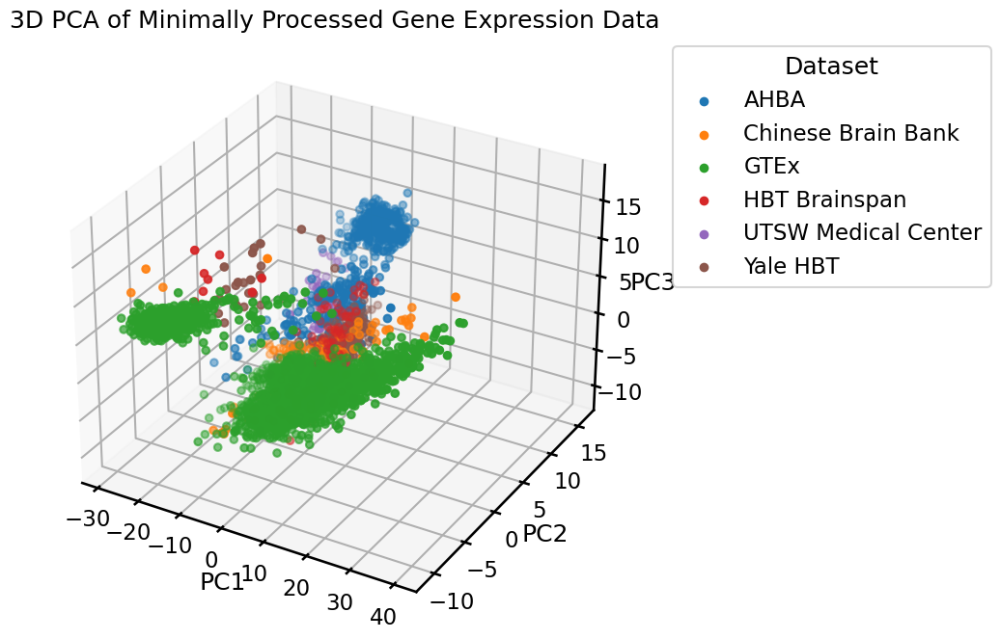

In [78]:
# Step 1: Extract gene expression data (assuming gene columns start from the 11th column onward)
gene_columns = minimal_processed_df.columns[10:]

# Step 2: Extract the gene data as a NumPy array
processed_gene_array = minimal_processed_df[gene_columns].to_numpy()

# Step 3: Perform PCA on minimally processed data
pca_processed = PCA(n_components=3)
pca_processed_results = pca_processed.fit_transform(processed_gene_array)

# Step 4: Plot 3D PCA for minimally processed data
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

dataset_labels = minimal_processed_df['dataset'].values
unique_datasets = np.unique(dataset_labels)
colors = sns.color_palette("tab10", len(unique_datasets))

# Plot each dataset with a different color
for i, dataset in enumerate(unique_datasets):
    indices = np.where(dataset_labels == dataset)
    ax.scatter(pca_processed_results[indices, 0], pca_processed_results[indices, 1], pca_processed_results[indices, 2], 
               color=colors[i], label=dataset, s=30)

ax.set_title('3D PCA of Minimally Processed Gene Expression Data')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.legend(title='Dataset', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


### UMAP

In [79]:


def run_umap(dataframe, gene_columns_start=10, n_components=2, n_neighbors=15, min_dist=0.1, metric='euclidean', n_jobs=-1):
    """
    Run UMAP on the specified dataframe and return the UMAP results.

    Parameters:
    - dataframe: pd.DataFrame, the dataframe containing gene expression data.
    - gene_columns_start: int, the index of the first gene column in the dataframe (default is 10).
    - n_components: int, the number of dimensions to reduce the data to (default is 2).
    - n_neighbors: int, the number of neighbors to consider for UMAP (default is 15).
    - min_dist: float, the minimum distance between points for UMAP (default is 0.1).
    - metric: str, the metric to use for UMAP (default is 'euclidean').
    - n_jobs: int, the number of parallel jobs to run (default is -1, which uses all available cores).

    Returns:
    - umap_results: np.ndarray, the result of UMAP transformation.
    """
    # Step 1: Extract gene expression data
    gene_columns = dataframe.columns[gene_columns_start:]

    # Step 2: Extract the gene data as a NumPy array
    gene_array = dataframe[gene_columns].to_numpy()

    # Step 3: Perform UMAP with parallelization
    # add random_state here for replicability if desired!
    umap_model = umap.UMAP(n_components=n_components, n_neighbors=n_neighbors, min_dist=min_dist, metric=metric, n_jobs=n_jobs)
    umap_results = umap_model.fit_transform(gene_array)

    return umap_results

def plot_umap(umap_results, dataframe, title="UMAP Plot", color_by='dataset'):
    """
    Create a 2D or 3D UMAP plot using Plotly.

    Parameters:
    - umap_results: np.ndarray, the result of UMAP transformation.
    - dataframe: pd.DataFrame, the dataframe containing metadata for color coding.
    - title: str, the title of the plot (default is "UMAP Plot").
    """

    hover_data = {
        "Dataset": dataframe['dataset'],
        "Region": dataframe['tissue sample local name']
    }
    
    
    if umap_results.shape[1] == 2:
        # 2D UMAP Plot
        fig = px.scatter(
            x=umap_results[:, 0],
            y=umap_results[:, 1],
            color=dataframe[color_by],
            labels={'color': color_by},
            hover_data=hover_data,
            title=title
        )
        fig.update_traces(marker=dict(size=3))  # Adjust marker size if necessary

    elif umap_results.shape[1] == 3:
        # 3D UMAP Plot
        fig = px.scatter_3d(
            x=umap_results[:, 0],
            y=umap_results[:, 1],
            z=umap_results[:, 2],
            color=dataframe[color_by],
            labels={'color': color_by},
            hover_data=hover_data,

            title=title
        )
        fig.update_traces(marker=dict(size=2))  # Adjust marker size if necessary

    else:
        raise ValueError("UMAP results must have either 2 or 3 components.")

    fig.show()


Raw data

In [80]:
# Run UMAP for raw data (2D)
umap_results_raw_2d = run_umap(combined_df, n_components=2)

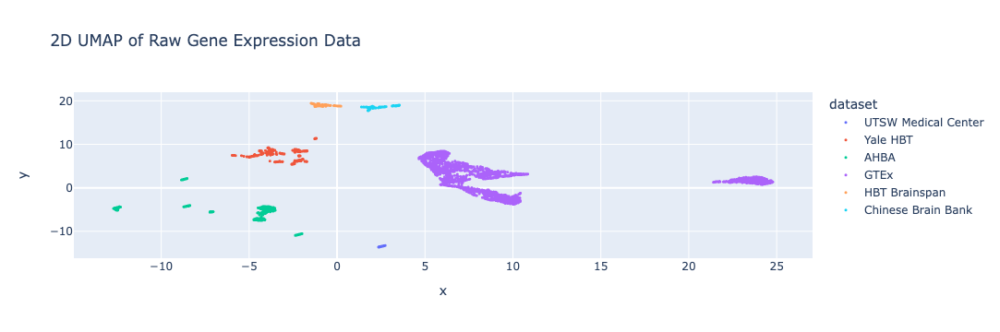

In [81]:
# Plot 2D UMAP for raw data
plot_umap(umap_results_raw_2d, combined_df, title="2D UMAP of Raw Gene Expression Data")

# umap_raw_results = umap_raw.fit_transform(scaler.fit_transform(np.log1p(raw_gene_array)))

In [82]:
# Run UMAP for raw data (3D)
umap_results_raw_3d = run_umap(combined_df, n_components=3)


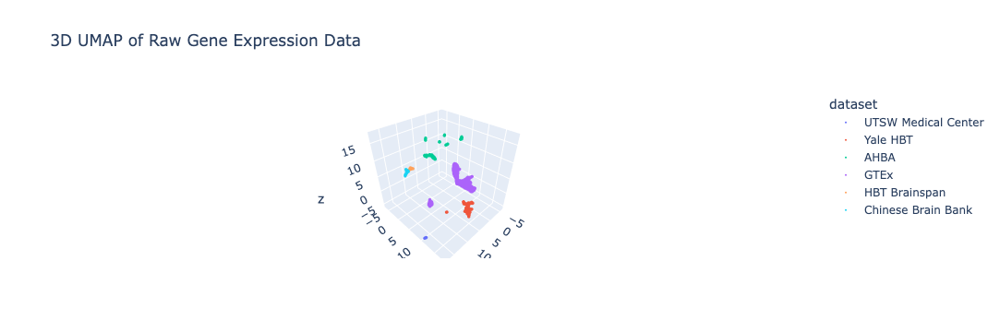

In [83]:
# Plot 3D UMAP for raw data
plot_umap(umap_results_raw_3d, combined_df, title="3D UMAP of Raw Gene Expression Data")

3D

In [84]:
# Run UMAP for minimally processed data (2D)
umap_results_processed_2d = run_umap(minimal_processed_df, n_components=2)


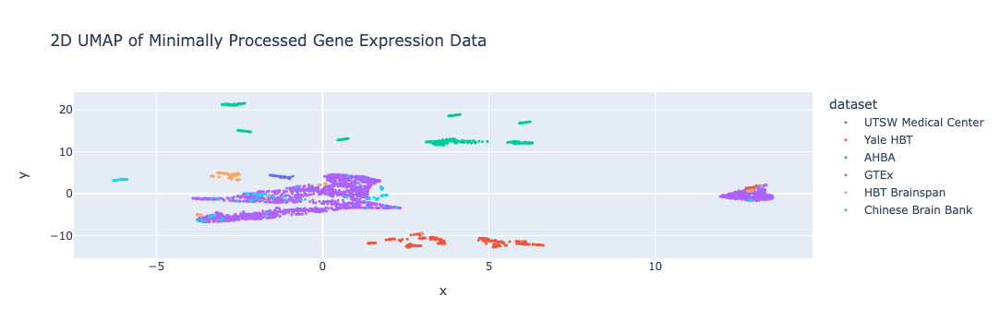

In [85]:
# Plot 2D UMAP for minimally processed data
plot_umap(umap_results_processed_2d, minimal_processed_df, title="2D UMAP of Minimally Processed Gene Expression Data")


In [86]:
# Run UMAP for minimally processed data (3D)
umap_results_processed_3d = run_umap(minimal_processed_df, n_components=3)

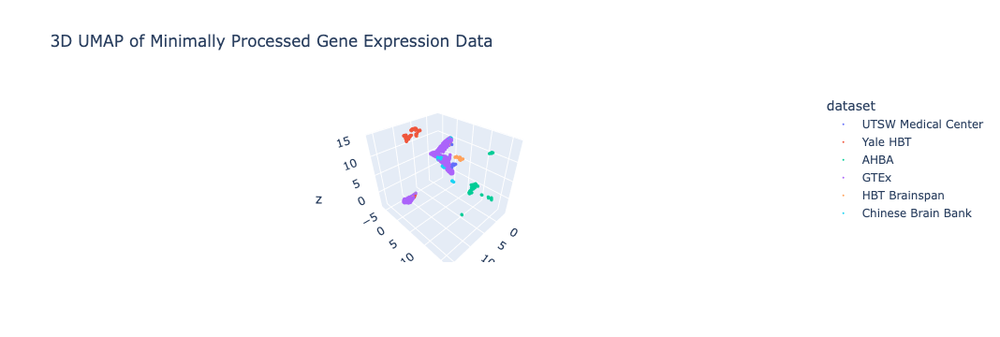

In [87]:
# Plot 3D UMAP for minimally processed data
plot_umap(umap_results_processed_3d, minimal_processed_df, title="3D UMAP of Minimally Processed Gene Expression Data")

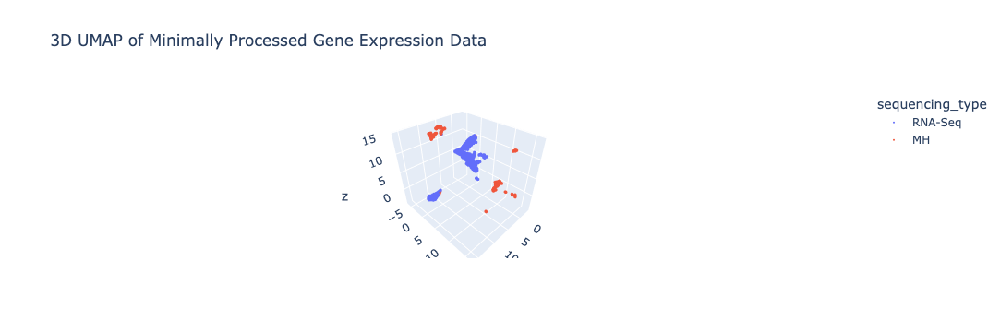

In [88]:
plot_umap(umap_results_processed_3d, minimal_processed_df, title="3D UMAP of Minimally Processed Gene Expression Data", color_by='sequencing_type')